In [1]:
from google.colab import drive
drive.mount('/drive')
%cd /drive/My Drive/notebooks

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /drive
/drive/My Drive/notebooks


In [0]:
import torch
import torchvision
import torchvision.transforms as transforms
import torchvision.utils as vutils


import matplotlib.pyplot as plt
import numpy as np
import random
import math

import os

In [3]:
PATH = os.path.join(os.getcwd(),'data')
log_PATH = os.path.join(os.getcwd(), "logs")
modelName = "f-GAN_Mnist"
batch_size =128
workers = 2
epochs = 20

latent_dim =100

gf_dim = 64
df_dim = 64

in_h = 64
in_w =64
c_dim = 1

TINY = 1e-6

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

manualSeed = 3734
print("Random Seed: ",manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  3734


In [0]:
transform = transforms.Compose(
    [
     transforms.Resize((in_h,in_w)),
     transforms.ToTensor(),
     transforms.Normalize((0.5,),(0.5,)),
     ]
)


def transform_inverse (y):
  t= None
  if y.size()[0]==1:
    t=torchvision.transforms.Normalize((-1,),(2,))
  else :
    t=torchvision.transforms.Normalize((-1,-1,-1),(2,2,2))
  return t(y)

def batch_transform_inverse(y):
  x = y.new(*y.size())
  if y.size()[1]==1:
    x[:, 0, :, :] = y[:, 0, :, :] * 2 - 1
  else:
    x[:, 0, :, :] = y[:, 0, :, :] * 2 - 1
    x[:, 1, :, :] = y[:, 1, :, :] * 2 - 1 
    x[:, 2, :, :] = y[:, 2, :, :] * 2 - 1
  return x

In [0]:
train_set = torchvision.datasets.MNIST(root=PATH,train=True,
                                      download=True,transform=transform)
train_loader = torch.utils.data.DataLoader(train_set,batch_size=batch_size,
                                          shuffle =True, num_workers=workers)

test_set = torchvision.datasets.MNIST(root=PATH,train=False,
                                     download=True, transform=transform)

test_loader = torch.utils.data.DataLoader(test_set, batch_size=batch_size,
                                          shuffle = False, num_workers=workers)

train_iter = iter(train_loader)
test_iter = iter(test_loader)

torch.Size([128, 1, 64, 64])


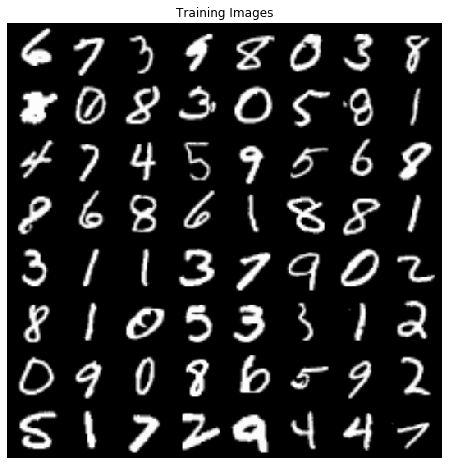

In [6]:
real_batch = next(iter(train_loader))
plt.figure(figsize=(8,8))
plt.axis('off')
plt.title('Training Images')
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64],padding=2, normalize=True).cpu(),(1,2,0)))

print(real_batch[0].size())

In [0]:
def conv_bn_layer(in_channels,out_channels,kernel_size,stride=1,padding=0):
    return nn.Sequential(
        nn.Conv2d(in_channels,out_channels,kernel_size,stride=stride,padding=padding),
        nn.BatchNorm2d(out_channels,momentum=0.1,eps=1e-5),
    )
def tconv_bn_layer(in_channels,out_channels,kernel_size,stride=1,padding=0):
  return nn.Sequential(
      nn.ConvTranspose2d(in_channels,out_channels,kernel_size,stride=stride,padding=padding),
      nn.BatchNorm2d(out_channels,momentum=0.1,eps=1e-5),
  )
def tconv_layer(in_channels,out_channels,kernel_size,stride=1,padding=0):
  return nn.ConvTranspose2d(in_channels,out_channels,kernel_size,stride=stride,padding=padding)

def conv_layer(in_channels,out_channels,kernel_size,stride=1,padding=0):
    return nn.Conv2d(in_channels,out_channels,kernel_size,stride=stride,padding=padding)

def fc_layer(in_features,out_features):
  return nn.Linear(in_features,out_features)

def fc_bn_layer(in_features,out_features):
  return nn.Sequential(
      nn.Linear(in_features,out_features),
      nn.BatchNorm1d(out_features)
  )


In [0]:
def conv_out_size_same(size, stride):
  return int(math.ceil(float(size) / float(stride)))
s_h, s_w = in_h, in_w
s_h2, s_w2 = conv_out_size_same(s_h, 2), conv_out_size_same(s_w, 2)
s_h4, s_w4 = conv_out_size_same(s_h2, 2), conv_out_size_same(s_w2, 2)
s_h8, s_w8 = conv_out_size_same(s_h4, 2), conv_out_size_same(s_w4, 2)
s_h16, s_w16 = conv_out_size_same(s_h8, 2), conv_out_size_same(s_w8, 2)

In [0]:
import torch.nn as nn
import torch.nn.functional as F

"""
parameters : theta
"""

class Q(nn.Module):
  def __init__(self):
    super(Q,self).__init__()
    self.projection_z = fc_bn_layer(latent_dim,s_h16*s_w16*gf_dim*8)

    self.theta_params = nn.Sequential(
    tconv_bn_layer(gf_dim*8,gf_dim*4,4,stride=2,padding=1),
    nn.ReLU(),
    tconv_bn_layer(gf_dim*4,gf_dim*2,4,stride=2,padding=1),
    nn.ReLU(),
    tconv_bn_layer(gf_dim*2,gf_dim,4,stride=2,padding=1),
    nn.ReLU(),
    tconv_layer(gf_dim,c_dim,4,stride=2,padding=1),
    nn.Tanh()
    )
    
  def forward(self, x):
    x = F.relu(self.projection_z(x).view(-1,gf_dim*8,s_h16,s_w16))
    x =  self.theta_params(x)
    return x

In [0]:
"""
input : X ( data )
output : R (scalar) logit

parameters : w
"""
class V(nn.Module):
  def __init__(self):
    super(V,self).__init__()
    self.w_params = nn.Sequential (
        conv_layer(c_dim,df_dim,4,stride=2,padding=1),
        nn.LeakyReLU(0.1),
        conv_bn_layer(df_dim,df_dim*2,4,stride=2,padding=1),
        nn.LeakyReLU(0.1),
        conv_bn_layer(df_dim*2,df_dim*4,4,stride=2,padding=1),
        nn.LeakyReLU(0.1),
        conv_bn_layer(df_dim*4,df_dim*8,4,stride=2,padding=1),
        nn.LeakyReLU(0.1),
        nn.Flatten(1),
        fc_layer(df_dim*8*s_h16*s_w16,1)
    )

  def forward(self, x):
    x = self.w_params(x)

    return x

In [0]:
class Activation_g(nn.Module):
  def __init__(self,divergence="GAN"):
    super(Activation_g,self).__init__()
    self.divergence =divergence
  def forward(self,v):
    divergence = self.divergence
    if divergence == "KLD":
      return v
    elif divergence == "RKL":
      return -torch.exp(-v)
    elif divergence == "CHI":
      return v
    elif divergence == "SQH":
      return 1-torch.exp(-v)
    elif divergence == "JSD":
      return torch.log(2)-torch.log(1.0+torch.exp(-v))
    elif divergence == "GAN":
      return -torch.log(1.0+torch.exp(-v)) # log sigmoid

In [0]:
class Conjugate_f(nn.Module):
  def __init__(self,divergence="GAN"):
    super(Conjugate_f,self).__init__()
    self.divergence = divergence
  def forward(self,t):
    divergence= self.divergence
    if divergence == "KLD":
      return torch.exp(t-1)
    elif divergence == "RKL":
      return -1 -torch.log(-t)
    elif divergence == "CHI":
      return 0.25*x**2+t
    elif divergence == "SQH":
      return t/(torch.tensor(1.)-t)
    elif divergence == "JSD":
      return -torch.log(torch.tensor(2.)-torch.exp(t))
    elif divergence == "GAN":
      return  -torch.log(1.0-torch.exp(t))

In [0]:
class VLOSS(nn.Module):
  def __init__(self,divergence="GAN"):
    super(VLOSS,self).__init__()
    self.activation = Activation_g(divergence)
  def forward(self,v):
    return torch.mean(self.activation(v))

In [0]:
class QLOSS(nn.Module):
  def __init__(self,divergence="GAN"):
    super(QLOSS,self).__init__()
    self.conjugate = Conjugate_f(divergence)
    self.activation = Activation_g(divergence)
  def forward(self,v):
    return torch.mean(-self.conjugate(self.activation(v)))

In [0]:
import torch.optim as optim

Q_net = Q().to(device)
V_net = V().to(device)

Q_criterion =QLOSS(divergence="GAN")
V_criterion =VLOSS(divergence="GAN")

Q_optimizer = optim.Adam(Q_net.parameters(),lr=2e-4,betas=(0.5,0.9))
V_optimizer = optim.Adam(V_net.parameters(),lr=2e-4,betas=(0.5,0.9))

fixed_noise = torch.randn(batch_size, latent_dim,device=device)

In [16]:
def weights_init(m):
  classname = m.__class__.__name__
  if classname.find('Conv')!=-1 or classname.find('Linear')!=-1:
    nn.init.normal_(m.weight.data,0.0,0.02)
  elif classname.find('BatchNorm')!=-1:
    nn.init.normal_(m.weight.data,1.0,0.02)
    nn.init.constant_(m.bias.data,0)

print(Q_net.apply(weights_init))
print(V_net.apply(weights_init))

Q(
  (projection_z): Sequential(
    (0): Linear(in_features=100, out_features=8192, bias=True)
    (1): BatchNorm1d(8192, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (theta_params): Sequential(
    (0): Sequential(
      (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): ReLU()
    (2): Sequential(
      (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (3): ReLU()
    (4): Sequential(
      (0): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (5): ReLU()
    (6): ConvTranspose2d(64, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): Tanh()
  )
)
V(
  (w

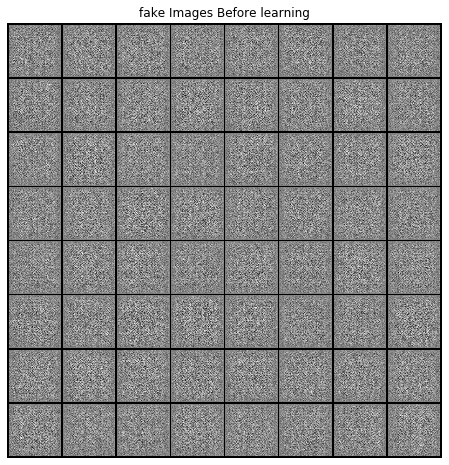

In [17]:
with torch.no_grad():
  fake_batch=Q_net(fixed_noise)
plt.figure(figsize=(8,8))
plt.axis('off')
plt.title('fake Images Before learning')
plt.imshow(np.transpose(vutils.make_grid(fake_batch.to(device)[:64].view(64,c_dim,in_h,in_w),padding=2, normalize=True).cpu(),(1,2,0)))

In [0]:
act=Activation_g("GAN")
con=Conjugate_f("GAN")

In [19]:
act(V_net(fake_batch))[0]

tensor([-0.5152], device='cuda:0', grad_fn=<SelectBackward>)

In [20]:
V_net(fake_batch)[0]

tensor([0.3946], device='cuda:0', grad_fn=<SelectBackward>)

In [0]:
img_list = []
Q_losses = []
V_losses = []

iter_per_plot = 250
plot_per_eps=(int(len(train_loader)/iter_per_plot)+1)

transform_PIL=transforms.ToPILImage()

In [22]:
for ep in range(epochs):
  for i, (data, _) in enumerate(train_loader):
    b_size=data.shape[0]
    data = data.to(device)

    #Train V
    V_net.zero_grad()

    v = V_net(data)
    loss_real = -V_criterion(v)
    loss_real.backward(retain_graph=True)

    z = torch.randn(b_size,latent_dim).to(device)
    fake_data = Q_net(z)
    v_fake = V_net(fake_data.detach())
    loss_fake = -Q_criterion(v_fake)
    loss_fake.backward()#maximize F

    loss_V = -(loss_real + loss_fake)
    V_optimizer.step()

    #Train G 
    Q_net.zero_grad()
    v_fake = V_net(fake_data)

    #loss_Q = Q_criterion(v_fake)# minimize F
    loss_Q = -V_criterion(v_fake)# maximize F (trick way)
    loss_Q.backward()
    Q_optimizer.step()


    if (i+1)%iter_per_plot == 0 or i ==0:
      print('Epoch [{}/{}], Step [{}/{}], V_loss: {:.4f}, Q_loss: {:.4f}, T(x): {:.4f}, T(Q(z)): {:.4f}' 
            .format(ep, epochs, i+1, len(train_loader), loss_V.item(), loss_Q.item(), 
                    loss_real.mean().item(), loss_fake.mean().item()))
      Q_losses.append(loss_Q.item())
      V_losses.append(loss_V.item())
      with torch.no_grad():
        fake = Q_net(fixed_noise).detach().cpu()
        img_list.append(vutils.make_grid(torch.reshape(fake,(b_size,c_dim,in_h,in_w))[:64], padding=2, normalize=True))
        transform_PIL(img_list[-1]).save(os.path.join(log_PATH,str(ep)+modelName+"_Last.png"))

Epoch [0/20], Step [1/469], V_loss: -1.4935, Q_loss: 6.2777, T(x): 0.93, T(Q(z)): 0.56
Epoch [0/20], Step [250/469], V_loss: -0.4985, Q_loss: 2.9527, T(x): 0.23, T(Q(z)): 0.26
Epoch [1/20], Step [1/469], V_loss: -0.2423, Q_loss: 3.8892, T(x): 0.06, T(Q(z)): 0.18
Epoch [1/20], Step [250/469], V_loss: -0.2901, Q_loss: 2.1197, T(x): 0.21, T(Q(z)): 0.08
Epoch [2/20], Step [1/469], V_loss: -0.2039, Q_loss: 2.5163, T(x): 0.18, T(Q(z)): 0.03
Epoch [2/20], Step [250/469], V_loss: -0.0703, Q_loss: 4.1956, T(x): 0.04, T(Q(z)): 0.03
Epoch [3/20], Step [1/469], V_loss: -0.1067, Q_loss: 5.8017, T(x): 0.03, T(Q(z)): 0.07
Epoch [3/20], Step [250/469], V_loss: -0.0470, Q_loss: 7.2804, T(x): 0.01, T(Q(z)): 0.04
Epoch [4/20], Step [1/469], V_loss: -0.0376, Q_loss: 5.5549, T(x): 0.02, T(Q(z)): 0.02
Epoch [4/20], Step [250/469], V_loss: -0.1398, Q_loss: 3.3580, T(x): 0.04, T(Q(z)): 0.10
Epoch [5/20], Step [1/469], V_loss: -0.0939, Q_loss: 4.1339, T(x): 0.07, T(Q(z)): 0.03
Epoch [5/20], Step [250/469], V_l

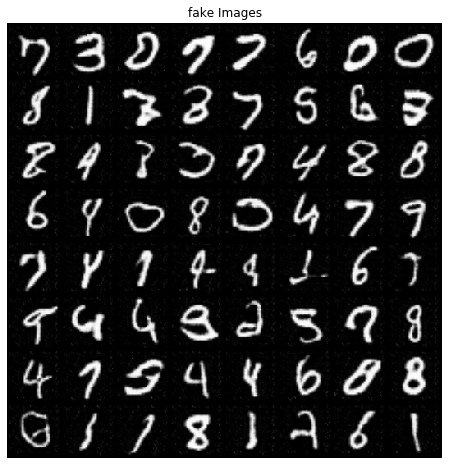

In [23]:
with torch.no_grad():
  fake_batch=Q_net(fixed_noise)
plt.figure(figsize=(8,8))
plt.axis('off')
plt.title('fake Images')
plt.imshow(np.transpose(vutils.make_grid(fake_batch.to(device)[:64].view(64,c_dim,in_h,in_w),padding=2, normalize=True).cpu(),(1,2,0)))

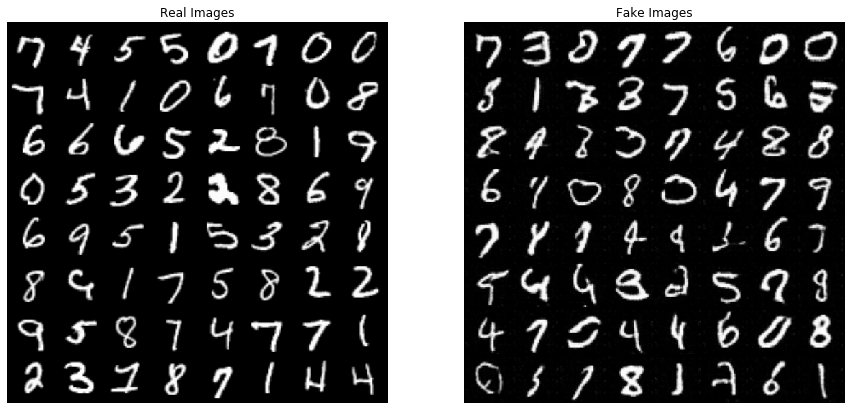

In [24]:
real_batch = next(iter(train_loader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

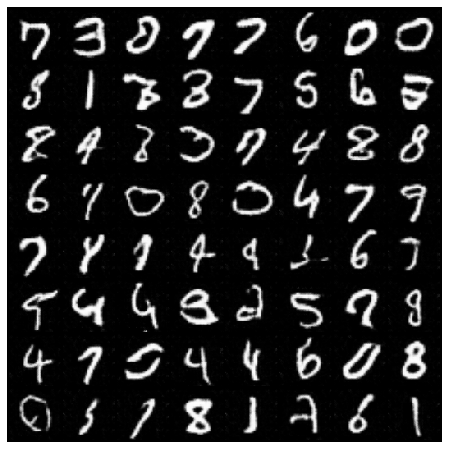

In [25]:
import matplotlib.animation as animation
from IPython.display import HTML
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [0]:
from PIL import Image
transform_PIL=transforms.ToPILImage()

p_img_list = [transform_PIL(p_image) for p_image in img_list]
p_img_list[0].save(modelName+'.gif', save_all=True,append_images=p_img_list[1:], optimize=False, duration=0.5, loop=0)

In [0]:
p_img_list[-1].save(modelName+"_last_result.png")

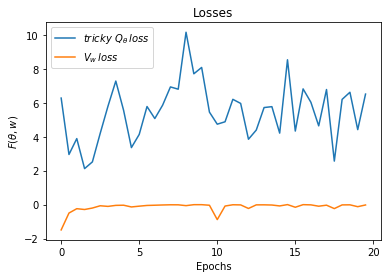

<Figure size 432x288 with 0 Axes>

In [53]:
plt.title("Losses")
epsilon = 1/plot_per_eps
X = np.array(range(plot_per_eps*epochs))/plot_per_eps

plt.plot(X,Q_losses,label=r"$tricky \/\/ Q_\theta \/ loss$")
plt.plot(X,V_losses,label=r"$V_w \/ loss$")
plt.legend(loc=2)
plt.xticks(np.arange(0,epochs+1,5)) 
plt.ylabel(r"$F(\theta,w)$")
plt.xlabel("Epochs")
plt.show()
plt.savefig(modelName+"_loss_figure.png")

In [0]:
torch.save(Q_net.state_dict(),"./Q_"+modelName+".pth")

In [63]:
Q_net.load_state_dict(torch.load("Q_"+modelName+".pth"))

<All keys matched successfully>

In [0]:
torch.save(V_net.state_dict(),"./V_"+modelName+".pth")

In [64]:
V_net.load_state_dict(torch.load("V_"+modelName+".pth"))

<All keys matched successfully>